# Figure 5 - OMIM modeling

In [2]:
import scanpy as sc
import pandas as pd
import pickle
import numpy as np
import plotnine as p9
import fisher
import sys
from tqdm.auto import tqdm
import joblib

from plotnine import *

In [3]:
from pathlib import Path

sys.path.append(str(Path.home() / 'Code/sctoolkit'))

In [4]:
from sctoolkit.utils import sort_by_correlation

In [5]:
sc.set_figure_params(dpi=100)
sc.settings.figdir = 'figures/'

## Read data

In [5]:
adata = sc.read('adata.h5ad')

## Read OMIM gene sets

In [134]:
omim_genes = pd.read_pickle(str(Path.home() / 'Code/omim_topics/omim_gene_sets_p99_dataframe.pkl'))
omim_genes = omim_genes.explode(['genes', 'transcripts', 'names', 'mims']).sort_values(['topicname', 'score'], ascending=[True, False]).rename(columns={'topicname': 'topic', 'genes': 'gene'})
omim_genes = omim_genes[omim_genes.gene.notnull()].copy()
omim_genes['topicno'] = [x.split(':')[0] for x in omim_genes.topic]
omim_genes.head(40)

,omimno,title,gene,text,transcripts,names,mims,score,topic
0,618231,"EPIDERMODYSPLASIA VERRUCIFORMIS, SUSCEPTIBILITY TO, 2; EV2",TMC8,Epidermodysplasia verruciformis (EV) is a rare genodermatosis associated with a high risk of ski...,ENST00000318430.10,Epidermodysplasia verruciformis 2,605829,0.110482,"0:noonan,nf2,melanoma,braf,ptpn11"
1,611553,NOONAN SYNDROME 5; NS5,RAF1,"{1:Pandit et al. (2007)} analyzed the RAF1 gene, a serine-threonine kinase that activates MEK1 (...",ENST00000251849.9,Noonan syndrome 5,164760,0.098958,"0:noonan,nf2,melanoma,braf,ptpn11"
2,609048,"MELANOMA, CUTANEOUS MALIGNANT, SUSCEPTIBILITY TO, 3; CMM3",CDK4,Malignant melanoma is a neoplasm of pigment-producing cells called melanocytes that occurs most ...,ENST00000257904.11,"{Melanoma, cutaneous malignant, 3}",123829,0.090909,"0:noonan,nf2,melanoma,braf,ptpn11"
3,615670,SCHWANNOMATOSIS 2; SWNTS2,LZTR1,Schwannomatosis is an adult-onset tumor predisposition syndrome characterized by the development...,ENST00000479606.5,"{Schwannomatosis-2, susceptibility to}",600574,0.086331,"0:noonan,nf2,melanoma,braf,ptpn11"
4,615279,CARDIOFACIOCUTANEOUS SYNDROME 3; CFC3,MAP2K1,Cardiofaciocutaneous syndrome (CFC) is a complex developmental disorder involving characteristic...,ENST00000307102.10,Cardiofaciocutaneous syndrome 3,176872,0.083636,"0:noonan,nf2,melanoma,braf,ptpn11"
5,162091,SCHWANNOMATOSIS 1; SWNTS1,SMARCB1,"Schwannomatosis, also known as neurilemmomatosis, first reported by {13:Niimura (1973)} as neuro...",ENST00000407422.8,"{Schwannomatosis-1, susceptibility to}",601607,0.082929,"0:noonan,nf2,melanoma,braf,ptpn11"
5,162091,SCHWANNOMATOSIS 1; SWNTS1,NF2,"Schwannomatosis, also known as neurilemmomatosis, first reported by {13:Niimura (1973)} as neuro...",ENST00000338641.10,"Schwannomatosis, somatic",607379,0.082929,"0:noonan,nf2,melanoma,braf,ptpn11"
6,226400,"EPIDERMODYSPLASIA VERRUCIFORMIS, SUSCEPTIBILITY TO, 1; EV1",TMC6,Epidermodysplasia verruciformis (EV) is a rare genodermatosis associated with a high risk of ski...,ENST00000590602.6,Epidermodysplasia verruciformis,605828,0.076590,"0:noonan,nf2,melanoma,braf,ptpn11"
7,607785,JUVENILE MYELOMONOCYTIC LEUKEMIA; JMML,ARHGAP26,Juvenile myelomonocytic leukemia is an aggressive pediatric myelodysplastic syndrome (MDS)/myelo...,ENST00000274498.9,"Leukemia, juvenile myelomonocytic, somatic",605370,0.068881,"0:noonan,nf2,melanoma,braf,ptpn11"
7,607785,JUVENILE MYELOMONOCYTIC LEUKEMIA; JMML,CBL,Juvenile myelomonocytic leukemia is an aggressive pediatric myelodysplastic syndrome (MDS)/myelo...,ENST00000264033.6,?Juvenile myelomonocytic leukemia,165360,0.068881,"0:noonan,nf2,melanoma,braf,ptpn11"


In [82]:
omim_genes_export = omim_genes.copy()
omim_genes_export['text'] = [x[:250] for x in omim_genes_export['text']]
omim_genes_export.to_excel('all_omim_genes.xlsx', index=False)

## Load DEGs

In [8]:
de = pd.read_pickle('../DE/de_granular.pkl')
de_broad = pd.read_pickle('../DE/de_broad.pkl')

In [9]:
de

,celltype,gene,tstat,pvals,pvals_fdr,log2FC,fraction_group,fraction_rest,mean_expressed,spring_score,tissue,marker,significant,spring_score_nonzero
0,Adipocyte,ACACB,116.209862,0.000000e+00,0.000000e+00,7.378525,0.989749,0.050786,2.252317,1.921656,Breast,,True,1.921656
1,Adipocyte,FASN,73.344101,0.000000e+00,0.000000e+00,5.751882,0.904897,0.067257,1.597452,1.691138,Breast,,True,1.691138
2,Adipocyte,LPIN1,69.438484,0.000000e+00,0.000000e+00,5.585775,0.893508,0.073122,1.470923,1.667113,Breast,Adipocyte,True,1.667113
3,Adipocyte,MLXIPL,68.346466,0.000000e+00,0.000000e+00,7.598430,0.858200,0.010232,1.058530,1.727318,Breast,,True,1.727318
4,Adipocyte,EBF1,65.418724,0.000000e+00,0.000000e+00,4.084034,0.900911,0.123409,1.322609,1.401352,Breast,Adipocyte,True,1.401352
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342183,Unknown (SFN-GJA1),ARL15,-21.668438,1.337465e-83,2.971848e-80,-3.627186,0.035714,0.297270,0.730008,-0.456783,Skin,,False,0.000000
342184,Unknown (SFN-GJA1),LDLRAD4,-21.863287,2.175499e-95,8.459427e-92,-5.113667,0.006494,0.164973,0.693147,-0.370510,Skin,,False,0.000000
342185,Unknown (SFN-GJA1),RALGAPA2,-23.831993,2.072160e-100,1.074346e-96,-4.127691,0.032468,0.301654,0.693147,-0.473259,Skin,,False,0.000000
342186,Unknown (SFN-GJA1),PTPRM,-27.015974,1.296138e-120,1.008006e-116,-3.929472,0.032468,0.302251,0.774240,-0.544440,Skin,,False,0.000000


In [10]:
de.shape

(2814679, 14)

In [11]:
de['sig_and_pos'] = de.significant & (de.log2FC>1)
de_broad['sig_and_pos'] = de_broad.significant & (de_broad.log2FC>1)

In [12]:
de_broad['tissue-celltype'] = de_broad.tissue + '|' + de_broad.celltype

In [13]:
de['tissue-celltype'] = de.tissue.astype(str) + '|' + de.celltype.astype(str)

In [14]:
de

,celltype,gene,tstat,pvals,pvals_fdr,log2FC,fraction_group,fraction_rest,mean_expressed,spring_score,tissue,marker,significant,spring_score_nonzero,sig_and_pos,tissue-celltype
0,Adipocyte,ACACB,116.209862,0.000000e+00,0.000000e+00,7.378525,0.989749,0.050786,2.252317,1.921656,Breast,,True,1.921656,True,Breast|Adipocyte
1,Adipocyte,FASN,73.344101,0.000000e+00,0.000000e+00,5.751882,0.904897,0.067257,1.597452,1.691138,Breast,,True,1.691138,True,Breast|Adipocyte
2,Adipocyte,LPIN1,69.438484,0.000000e+00,0.000000e+00,5.585775,0.893508,0.073122,1.470923,1.667113,Breast,Adipocyte,True,1.667113,True,Breast|Adipocyte
3,Adipocyte,MLXIPL,68.346466,0.000000e+00,0.000000e+00,7.598430,0.858200,0.010232,1.058530,1.727318,Breast,,True,1.727318,True,Breast|Adipocyte
4,Adipocyte,EBF1,65.418724,0.000000e+00,0.000000e+00,4.084034,0.900911,0.123409,1.322609,1.401352,Breast,Adipocyte,True,1.401352,True,Breast|Adipocyte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
342183,Unknown (SFN-GJA1),ARL15,-21.668438,1.337465e-83,2.971848e-80,-3.627186,0.035714,0.297270,0.730008,-0.456783,Skin,,False,0.000000,False,Skin|Unknown (SFN-GJA1)
342184,Unknown (SFN-GJA1),LDLRAD4,-21.863287,2.175499e-95,8.459427e-92,-5.113667,0.006494,0.164973,0.693147,-0.370510,Skin,,False,0.000000,False,Skin|Unknown (SFN-GJA1)
342185,Unknown (SFN-GJA1),RALGAPA2,-23.831993,2.072160e-100,1.074346e-96,-4.127691,0.032468,0.301654,0.693147,-0.473259,Skin,,False,0.000000,False,Skin|Unknown (SFN-GJA1)
342186,Unknown (SFN-GJA1),PTPRM,-27.015974,1.296138e-120,1.008006e-116,-3.929472,0.032468,0.302251,0.774240,-0.544440,Skin,,False,0.000000,False,Skin|Unknown (SFN-GJA1)


In [15]:
de_broad

,celltype,gene,tstat,pvals,pvals_fdr,log2FC,fraction_group,fraction_rest,mean_expressed,spring_score,tissue,marker,spring_score_nonzero,significant,sig_and_pos,tissue-celltype
0,Adipocyte,ACACB,116.096718,0.000000e+00,0.000000e+00,7.396634,0.989211,0.050318,2.250690,1.919520,Breast,,1.919520,True,True,Breast|Adipocyte
1,Adipocyte,FASN,73.292519,0.000000e+00,0.000000e+00,5.755496,0.904032,0.066925,1.596257,1.687813,Breast,,1.687813,True,True,Breast|Adipocyte
2,Adipocyte,LPIN1,69.214905,0.000000e+00,0.000000e+00,5.580588,0.891539,0.073043,1.470428,1.661884,Breast,Adipocyte,1.661884,True,True,Breast|Adipocyte
3,Adipocyte,MLXIPL,68.294312,0.000000e+00,0.000000e+00,7.636932,0.856899,0.009989,1.058315,1.724225,Breast,,1.724225,True,True,Breast|Adipocyte
4,Adipocyte,EBF1,65.268257,0.000000e+00,0.000000e+00,4.079791,0.899489,0.123236,1.321814,1.397531,Breast,Adipocyte,1.397531,True,True,Breast|Adipocyte
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
248859,Unknown,PTPRG,-21.128510,3.825554e-87,9.917110e-84,-3.756716,0.022124,0.233641,1.085592,-0.414102,Skin,,0.000000,False,False,Skin|Unknown
248860,Unknown,TACC1,-22.081713,6.396807e-95,2.487399e-91,-3.656545,0.026549,0.246154,0.726936,-0.422170,Skin,,0.000000,False,False,Skin|Unknown
248861,Unknown,EBF1,-23.828735,5.178403e-114,4.027244e-110,-5.197264,0.008850,0.204103,0.693147,-0.404291,Skin,Adipocyte,0.000000,False,False,Skin|Unknown
248862,Unknown,AKT3,-24.039705,8.475071e-107,4.394042e-103,-3.625702,0.035398,0.298256,0.787152,-0.487560,Skin,,0.000000,False,False,Skin|Unknown


## Fisher test for disease group enrichments

In [16]:
background = sorted(list(set(sorted(de_broad[de_broad.sig_and_pos].gene.unique().tolist()) + omim_genes.gene.unique().tolist())))

In [17]:
fisher_df = pd.DataFrame(dict(background=background))
fisher_df

,background
0,A1BG
1,A1CF
2,A2M
3,A2ML1
4,A3GALT2
...,...
16635,ZXDC
16636,ZYG11A
16637,ZYG11B
16638,ZYX


In [18]:
for topic in sorted(omim_genes['topic'].unique()):
    fisher_df[topic] = False
    disease_genes = omim_genes[omim_genes['topic'] == topic].gene.unique()
    fisher_df[topic].loc[fisher_df.background.isin(disease_genes)] = True

/home/gokcen/.miniconda3/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
/tmp/ipykernel_139325/975408246.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [19]:
fisher_df.iloc[:, 1:].sum(0)

0:noonan,nf2,melanoma,braf,ptpn11                        49
100:congenita,pten,telomere,nevus,nevi                   50
101:myopia,microphthalmia,iris,coloboma,anophthalmia     52
102:deficiency,activity,enzymatic,substrate              59
103:neuromuscular,synaptic,repetitive,myasthenic,achr    47
                                                         ..
96:biopsy,membrane,accumulation,systemic,deposits        58
97:plasma,urinary,laboratory,biochemical,synthesis       60
98:human,mouse,role,mrna,expressed                       80
99:calcium,channel,sodium,paralysis,potassium            46
9:individuals,chromosome,cases,type,genetic              59
Length: 229, dtype: int64

In [20]:
for tc in sorted(de_broad['tissue-celltype'].unique()):
    fisher_df[tc] = False
    de_genes = de_broad[(de_broad['tissue-celltype'] == tc) & (de_broad.sig_and_pos)].gene.unique().tolist()
    fisher_df[tc].loc[fisher_df.background.isin(de_genes)] = True

/tmp/ipykernel_139325/90197552.py:2: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`


In [ ]:
%%time

topics = sorted(omim_genes['topic'].unique())

fisher_pval = pd.DataFrame(1, index=topics, columns=sorted(de_broad['tissue-celltype'].unique()))
fisher_logodds = pd.DataFrame(0, index=topics, columns=sorted(de_broad['tissue-celltype'].unique()))
fisher_intersections = pd.DataFrame(index=topics, columns=sorted(de_broad['tissue-celltype'].unique()))

from fisher import pvalue
from statsmodels.stats.multitest import multipletests

for disease in tqdm(topics):
    for tc in sorted(de_broad['tissue-celltype'].unique()):
        m = pd.crosstab(fisher_df[disease], fisher_df[tc])
        try:
            a = m.loc[True, True]
        except KeyError:
            a = 0
        try:
            b = m.loc[True, False]
        except KeyError:
            b = 0
        try:
            c = m.loc[False, True]
        except KeyError:
            c = 0        
        try:
            d = m.loc[False, False]
        except KeyError:
            d = 0

        with np.errstate(invalid='ignore', divide='ignore'):
            fisher_logodds.loc[disease, tc] = np.log2((a*d) / (b*c))
        fisher_pval.loc[disease, tc] = pvalue(a, b, c, d).right_tail
        ints = tuple(fisher_df.background[fisher_df[disease] & fisher_df[tc]].tolist())
        fisher_intersections.loc[disease, tc] = ints

fdr = multipletests(fisher_pval.values.flatten(), method='fdr_bh')[1]
fisher_pval = pd.DataFrame(fdr.reshape(fisher_pval.shape), index=topics, columns=sorted(de_broad['tissue-celltype'].unique()))

fisher_result = fisher_pval.reset_index().melt(id_vars='index', var_name='tissue-celltype', value_name='pval_fdr').rename(columns={'index': 'Topic'})
fisher_result['logOR'] = fisher_logodds.reset_index().melt(id_vars='index', var_name='tissue-celltype', value_name='logOR').logOR
fisher_result['significant'] = (fisher_result.pval_fdr < 0.1) & (fisher_result.logOR>0)
fisher_result['neglog_pval_adj'] = -np.log10(fisher_result.pval_fdr.tolist())
fisher_result['tissue'] = [x.split('|')[0] for x in fisher_result['tissue-celltype']]
fisher_result['celltype'] = [x.split('|')[1] for x in fisher_result['tissue-celltype']]
fisher_result['intersection'] = fisher_intersections.reset_index().melt(id_vars='index', var_name='tissue-celltype', value_name='intersection').intersection
fisher_result['intersection_size'] = [len(x) for x in fisher_result['intersection']]
fisher_result['intersection'] = [','.join(x) for x in fisher_result['intersection']]
fisher_result = fisher_result.sort_values('pval_fdr').reset_index(drop=True)
fisher_result['topicno'] = [int(x.split(':')[0]) for x in fisher_result.Topic]
fisher_result

In [ ]:
fisher_result.to_pickle('omim_fisher_old_topics_p99.pkl')

In [283]:
fisher_result = pd.read_pickle('omim_fisher_old_topics_p99.pkl')
fisher_result['topicno'] = [int(x.split(':')[0]) for x in fisher_result.Topic]

In [284]:
#fisher_result.to_excel('omim_fisher_old_topics_p99.xlsx', index=False)

## Plotting

In [285]:
exclude_topics = [1, 2, 4, 9, 23, 27, 32, 35, 45, 50, 54, 58, 63, 68, 69, 71, 76, 80, 89, 91, 94, 95, 98, 102, 117, 134, 136, 139, 142, 144, 150, 180, 194, 201, 204, 225]
fisher_result = fisher_result[~fisher_result.topicno.isin(exclude_topics)].copy()

In [286]:
#sig_tc = (fisher_result.groupby('tissue-celltype')['significant'].count() != fisher_result.groupby('tissue-celltype')['pval_fdr'].sum())
sig_tc = fisher_result.groupby('tissue-celltype')['significant'].sum() >0

sig_tc = sig_tc[sig_tc].index.tolist()
fisher_result = fisher_result[fisher_result['tissue-celltype'].isin(sig_tc)]

#sig_disease = (fisher_result.groupby('Topic')['significant'].count() != fisher_result.groupby('Topic')['pval_fdr'].sum())
sig_disease = fisher_result.groupby('Topic')['significant'].sum() > 0
sig_disease = sig_disease[sig_disease].index.tolist()
fisher_result = fisher_result[fisher_result['Topic'].isin(sig_disease)]

In [287]:
df = fisher_result.copy()

In [288]:
mat = df[['Topic', 'tissue-celltype', 'significant']].pivot('Topic', 'tissue-celltype', 'significant')
topic_idx = sort_by_correlation(mat)
df['Topic'] = pd.Categorical(df['Topic'], categories=mat.index[topic_idx].astype(str))

tc_idx = sort_by_correlation(mat, rows=False)
df['tissue-celltype'] = pd.Categorical(df['tissue-celltype'], categories=mat.columns[tc_idx])

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_point : Removed 9195 rows containing missing values.


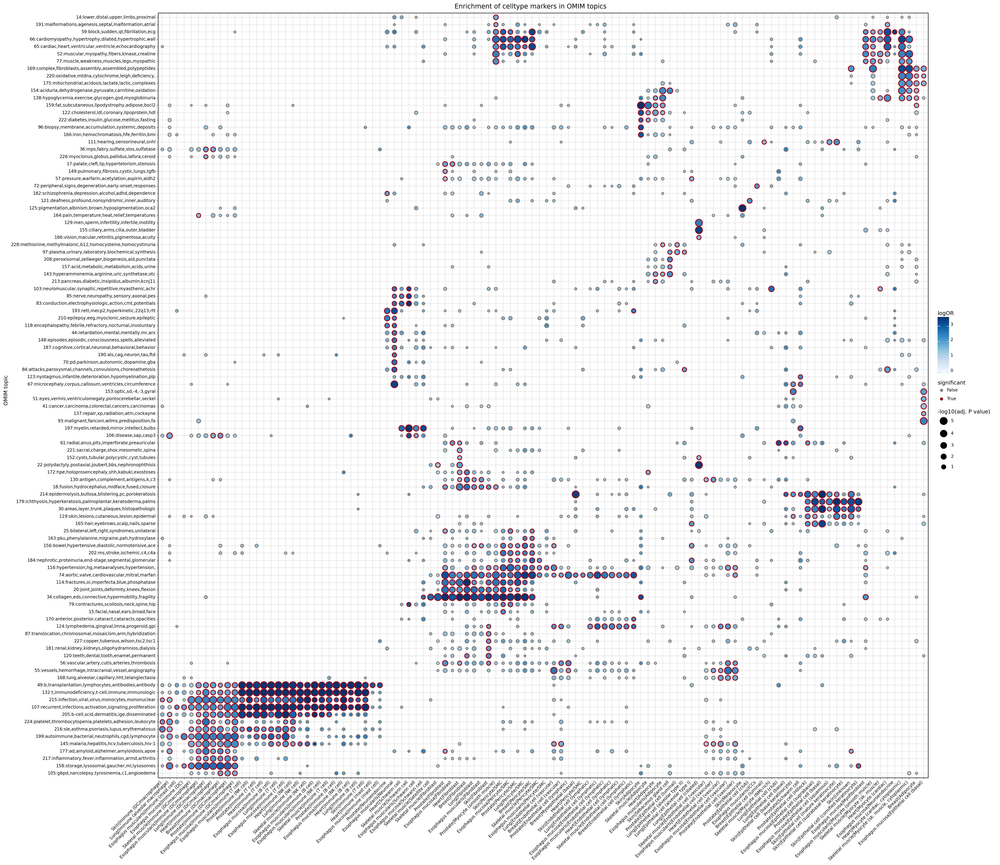

In [289]:
from plotnine import *

or_limit = 3.5
df.loc[df.logOR < -or_limit, 'logOR'] = -or_limit
df.loc[df.logOR > or_limit, 'logOR'] = or_limit
df.loc[df.neglog_pval_adj > 5, 'neglog_pval_adj'] = 5
df.loc[df.neglog_pval_adj == 0, 'neglog_pval_adj'] = np.nan

#df['tissue'] = pd.Categorical(df['tissue'], categories=['Skeletal muscle', 'Heart', 'Esophagus muscularis'])

limit = max(df.logOR.abs()) * np.array([-1, 1])

g = (
    ggplot(aes(x='tissue-celltype', y='Topic'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='logOR', color='significant'), stroke=1)+
    scale_fill_cmap('Blues', limits=[0, None]) +
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. P value)", y='OMIM topic', x='', title='Enrichment of celltype markers in OMIM topics') +
    guides(size = guide_legend(reverse=True)) +
    theme_linedraw() +
    scale_size(range = (1,7)) +
    scale_y_discrete(drop=False) +
    #scale_x_discrete(drop=False) +
    theme(
     strip_text_x = element_text(size=9, color='black', angle = 0),
     strip_text_y = element_text(size=9, color='black', angle = 0),      
     strip_background=element_rect(color='black', fill='white'),
      figure_size=(28,28),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)
print(g)

In [233]:
ggsave(g, 'full_enrichment_figure_topicandcelltypeclustered.pdf', limitsize=False)

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 28 x 28 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: full_enrichment_figure_topicandcelltypeclustered.pdf
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_point : Removed 9195 rows containing missing values.


## Plot subset of topics

In [290]:
fisher_result.head()

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,topicno
0,"132:t,immunodeficiency,t-cell,immune,immunologic",Esophagus mucosa|Immune (T cell),2.318080e-25,4.823698,True,24.634872,Esophagus mucosa,Immune (T cell),"BCL11B,CARD11,CD247,CD27,CD3E,CD3G,CD4,CD40LG,...",34,132
1,"132:t,immunodeficiency,t-cell,immune,immunologic",Lung|Immune (T cell),1.634328e-23,4.912204,True,22.786661,Lung,Immune (T cell),"BCL11B,CARD11,CD247,CD27,CD3E,CD3G,CD4,CD40LG,...",29,132
2,"132:t,immunodeficiency,t-cell,immune,immunologic",Heart|Immune (T cell),2.210271e-23,4.873540,True,22.655554,Heart,Immune (T cell),"BCL11B,CARD11,CD247,CD27,CD3E,CD3G,CD4,CD40LG,...",29,132
3,"132:t,immunodeficiency,t-cell,immune,immunologic",Prostate|Immune (T cell),1.749835e-21,4.617656,True,20.757003,Prostate,Immune (T cell),"BCL11B,CARD11,CD247,CD27,CD3E,CD3G,CD70,CD8A,C...",29,132
4,"132:t,immunodeficiency,t-cell,immune,immunologic",Esophagus muscularis|Immune (T cell),4.758885e-18,4.473002,True,17.322495,Esophagus muscularis,Immune (T cell),"BCL11B,CARD11,CD247,CD3E,CD3G,CD4,CD40LG,CD8A,...",25,132


In [291]:
selected_topics = [22, 34, 37, 38, 47, 52, 55, 56, 59, 65, 66, 72, 73, 74, 75, 77, 83, 84, 85, 99, 115, 119, 122, 124, 125, 128, 129, 132, 149, 155, 158, 159, 160, 178, 187, 190, 197, 205, 210, 213, 217, 222]

In [292]:
df = fisher_result[fisher_result.topicno.isin(selected_topics)].copy()
df = df[df.celltype != 'Unknown']

sig_tc = df.groupby('tissue-celltype')['significant'].sum() >0
sig_tc = sig_tc[sig_tc].index.tolist()
df = df[fisher_result['tissue-celltype'].isin(sig_tc)]

/tmp/ipykernel_139325/978847862.py:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.


In [293]:
mat = df[['Topic', 'tissue-celltype', 'significant']].pivot('Topic', 'tissue-celltype', 'significant')
topic_idx = sort_by_correlation(mat)
df['Topic'] = pd.Categorical(df['Topic'], categories=mat.index[topic_idx].astype(str))

mat = df[['Topic', 'tissue-celltype', 'significant']].pivot('Topic', 'tissue-celltype', 'significant')
tc_idx = sort_by_correlation(mat, rows=False)
df['tissue-celltype'] = pd.Categorical(df['tissue-celltype'], categories=mat.columns[tc_idx])

In [294]:
sorted_selected_topics = df.Topic.cat.categories[::-1].tolist()

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_point : Removed 2298 rows containing missing values.


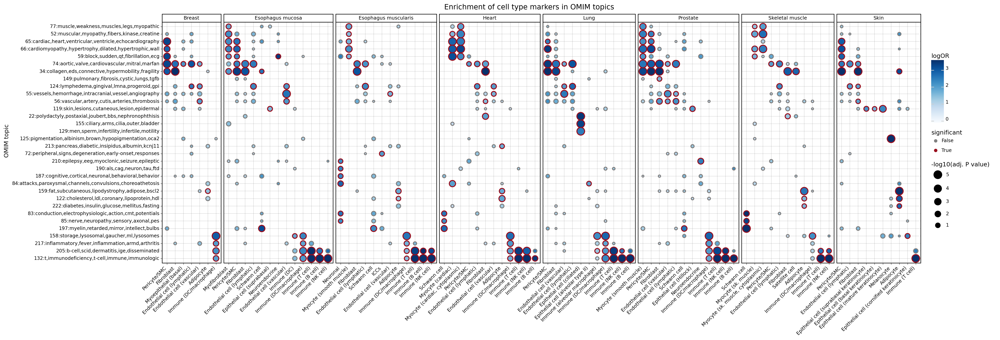

In [295]:
from plotnine import *

or_limit = 3.5
df.loc[df.logOR < -or_limit, 'logOR'] = -or_limit
df.loc[df.logOR > or_limit, 'logOR'] = or_limit
df.loc[df.neglog_pval_adj > 5, 'neglog_pval_adj'] = 5
df.loc[df.neglog_pval_adj == 0, 'neglog_pval_adj'] = np.nan

#df['Topic'] = pd.Categorical(df['Topic'], categories=sorted(df['Topic'].unique(), key=lambda x: int(x.split(':')[0]))[::-1])
#df['tissue'] = pd.Categorical(df['tissue'], categories=['Skeletal muscle', 'Heart', 'Esophagus muscularis'])

limit = max(df.logOR.abs()) * np.array([-1, 1])

g = (
    ggplot(aes(x='tissue-celltype', y='Topic'), data=df) +
    geom_point(aes(size='neglog_pval_adj', fill='logOR', color='significant'), stroke=1)+
    facet_grid('.~tissue', scales='free_x', space={'x': df.groupby('tissue')['tissue-celltype'].nunique()}) + 
    #scale_fill_distiller(type='div', limits=limit, name='log(odds ratio)') + 
    scale_fill_cmap('Blues', limits=[0, None]) +
    scale_color_manual(values=('#808080', '#990E1D')) + 
    labs(size = "-log10(adj. P value)", y='OMIM topic', x='', title='Enrichment of cell type markers in OMIM topics') +
    guides(size = guide_legend(reverse=True)) +
    theme_linedraw() +
    scale_size(range = (1,7)) +
    scale_y_discrete(drop=False) +
    scale_x_discrete(labels=lambda x: [y.split('|')[1] for y in x.keys()]) +
    theme(
     strip_text_x = element_text(size=9, color='black', angle = 0),
     strip_text_y = element_text(size=9, color='black', angle = 0),      
     strip_background=element_rect(color='black', fill='white'),
      figure_size=(25,8),
      legend_key=element_blank(),
      axis_text_x = element_text(rotation=45, hjust=1.),
    )
)
print(g)

In [240]:
ggsave(g, 'omim_tm_enrichment_subset.pdf', limitsize=False)

/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:719: PlotnineWarning: Saving 25 x 8 in image.
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/ggplot.py:722: PlotnineWarning: Filename: omim_tm_enrichment_subset.pdf
/home/gokcen/.miniconda3/lib/python3.8/site-packages/plotnine/layer.py:401: PlotnineWarning: geom_point : Removed 2298 rows containing missing values.


In [38]:
fisher_result[fisher_result.topicno == 213].head(20)

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,topicno
573,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Heart|Adipocyte,0.062771,1.753212,True,1.202239,Heart,Adipocyte,"ABCA1,AMN,ANXA5,BMS1,EOGT,HADH,HFE,NOTCH1,SAR1...",11,213
1140,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Esophagus muscularis|Adipocyte,0.319510,1.390273,False,0.495516,Esophagus muscularis,Adipocyte,"ABCA1,ABCC8,AMN,ANXA5,CUBN,GLUD1,HADH,KLF11,VEGFA",9,213
1248,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Breast|Adipocyte,0.368965,1.162450,False,0.433015,Breast,Adipocyte,"ABCA1,AMN,ANXA5,ARHGAP31,DOCK6,HADH,KLF11,NOTC...",12,213
1312,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Esophagus mucosa|Endothelial cell (vascular),0.413312,1.363674,False,0.383722,Esophagus mucosa,Endothelial cell (vascular),"ACE,ARHGAP31,AVPR2,CUBN,DLL4,DOCK6,KLF11,NOTCH1",8,213
1723,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Prostate|Epithelial cell (Hillock),0.574795,1.377089,False,0.240487,Prostate,Epithelial cell (Hillock),"AMN,CEL,GOT1,IL1RN,NOTCH1,SHH",6,213
1752,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Lung|Endothelial cell (vascular),0.583874,1.365079,False,0.233681,Lung,Endothelial cell (vascular),"ABCC8,ACE,ARHGAP31,DLL4,DOCK6,KLF11",6,213
1820,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Heart|Endothelial cell (vascular),0.607167,1.229980,False,0.216692,Heart,Endothelial cell (vascular),"ACE,ARHGAP31,AVPR2,DLL4,DOCK6,KLF11,NOTCH1",7,213
1834,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Esophagus muscularis|Endothelial cell (vascular),0.611732,1.224606,False,0.213439,Esophagus muscularis,Endothelial cell (vascular),"ACE,ARHGAP31,AVPR2,DLL4,DOCK6,KLF11,NOTCH1",7,213
2037,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Esophagus mucosa|Endothelial cell (lymphatic),0.675843,1.252827,False,0.170154,Esophagus mucosa,Endothelial cell (lymphatic),"ARHGAP31,AVPR2,CUBN,DLL4,DOCK6,NOTCH1",6,213
2747,"213:pancreas,diabetic,insipidus,albumin,kcnj11",Skeletal muscle|Adipocyte,0.895296,1.018358,False,0.048033,Skeletal muscle,Adipocyte,"ABCA1,ANXA5,EOGT,HADH,NOTCH1,VEGFA",6,213


In [39]:
fisher_result[fisher_result.topicno == 222].head(20)

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,topicno
592,"222:diabetes,insulin,glucose,mellitus,fasting",Skin|Adipocyte,0.068118,2.691662,True,1.166741,Skin,Adipocyte,"CIDEC,ENPP1,PLIN1,PPARG,TCF7L2",5,222
648,"222:diabetes,insulin,glucose,mellitus,fasting",Skeletal muscle|Adipocyte,0.093492,1.612150,True,1.029224,Skeletal muscle,Adipocyte,"ADIPOQ,CIDEC,ENPP1,GYS2,IGF2BP2,IRS1,IRS2,PLIN...",11,222
751,"222:diabetes,insulin,glucose,mellitus,fasting",Esophagus muscularis|Adipocyte,0.136408,1.440636,False,0.865159,Esophagus muscularis,Adipocyte,"ABCC8,ADIPOQ,AKT2,CIDEC,ENPP1,GLUD1,IRS2,KLF11...",12,222
1063,"222:diabetes,insulin,glucose,mellitus,fasting",Heart|Adipocyte,0.277388,1.277952,False,0.556912,Heart,Adipocyte,"ADIPOQ,AKT2,CIDEC,ENPP1,GCKR,IRS1,IRS2,PLIN1,P...",11,222
1317,"222:diabetes,insulin,glucose,mellitus,fasting",Lung|Immune (alveolar macrophage),0.416391,0.934456,False,0.380499,Lung,Immune (alveolar macrophage),"ADIPOQ,GCK,GK,GPD2,HMGA1,IL1RN,IL2RA,IL6,IRS2,...",17,222
1905,"222:diabetes,insulin,glucose,mellitus,fasting",Heart|Myocyte (cardiac),0.629782,0.815278,False,0.200809,Heart,Myocyte (cardiac),"ABCC8,CEL,EIF2AK3,GCK,GK,GYS2,IGF2BP2,INSR,PCS...",15,222
2443,"222:diabetes,insulin,glucose,mellitus,fasting",Skin|Melanocyte,0.813978,1.210231,False,0.089387,Skin,Melanocyte,"AKT2,GK,IGF2BP2,IRS2,SLC19A2",5,222
2719,"222:diabetes,insulin,glucose,mellitus,fasting",Lung|Fibroblast,0.886912,0.928735,False,0.052119,Lung,Fibroblast,"IGF2BP2,IL6,IRS1,IRS2,PCSK1,SLC19A2,SOD2",7,222
3399,"222:diabetes,insulin,glucose,mellitus,fasting",Prostate|Immune (DC/macrophage),1.000000,0.153989,False,-0.000000,Prostate,Immune (DC/macrophage),"CCR5,GK,GPD2,IL2RA,PPARG,PTPN1,RETN",7,222
3712,"222:diabetes,insulin,glucose,mellitus,fasting",Prostate|Immune (NK cell),1.000000,-inf,False,-0.000000,Prostate,Immune (NK cell),,0,222


In [296]:
adi_genes = fisher_result[(fisher_result.topicno == 222) & (fisher_result.celltype == 'Adipocyte')].set_index('tissue')[['intersection']]
adi_genes.intersection = adi_genes.intersection.str.split(',')
adi_genes = adi_genes.explode('intersection')

pd.options.display.max_colwidth = None
adi_genes.reset_index().groupby('intersection', observed=True).tissue.agg(lambda x: tuple(x)).reset_index().sort_values('tissue')

,intersection,tissue
18,WFS1,"(Breast,)"
16,TBC1D4,"(Esophagus muscularis,)"
6,GLUD1,"(Esophagus muscularis,)"
0,ABCC8,"(Esophagus muscularis,)"
11,KLF11,"(Esophagus muscularis, Breast)"
2,AKT2,"(Esophagus muscularis, Heart, Breast)"
5,GCKR,"(Heart,)"
15,SLC19A2,"(Heart,)"
7,GYS2,"(Skeletal muscle,)"
8,IGF2BP2,"(Skeletal muscle,)"


In [297]:
adi_genes = fisher_result[(fisher_result.topicno == 213) & (fisher_result.celltype == 'Adipocyte')].set_index('tissue')[['intersection']]
adi_genes.intersection = adi_genes.intersection.str.split(',')
adi_genes = adi_genes.explode('intersection')

pd.options.display.max_colwidth = None
adi_genes.reset_index().groupby('intersection', observed=True).tissue.agg(lambda x: tuple(x)).reset_index().sort_values('tissue')

,intersection,tissue
4,ARHGAP31,"(Breast,)"
7,DOCK6,"(Breast,)"
14,NUDT15,"(Breast,)"
15,PCBD1,"(Breast,)"
9,GLUD1,"(Esophagus muscularis,)"
1,ABCC8,"(Esophagus muscularis,)"
6,CUBN,"(Esophagus muscularis,)"
12,KLF11,"(Esophagus muscularis, Breast)"
5,BMS1,"(Heart,)"
16,SAR1B,"(Heart,)"


## Make expression plots for individual diseases

In [42]:
%%time

adata.layers['scaled'] = adata.X.copy()
sc.pp.scale(adata, max_value=10, layer='scaled')

CPU times: user 28.1 s, sys: 17.6 s, total: 45.7 s
Wall time: 45.7 s


In [298]:
tissue_ct_zscore = pd.DataFrame(adata.layers['scaled'], index=adata.obs_names, columns=adata.var_names).groupby([adata.obs.Tissue, adata.obs['Broad cell type']], observed=True).mean()
tissue_ct_zscore = tissue_ct_zscore.reset_index().melt(['Tissue', 'Broad cell type'], value_name='zscore_tissue_ct', var_name='gene').rename(columns={'Tissue': 'tissue', 'Broad cell type': 'celltype'})
tissue_ct_zscore.head()

,tissue,celltype,gene,zscore_tissue_ct
0,Skeletal muscle,"Myocyte (sk. muscle, cytoplasmic)",FO538757.2,-0.201838
1,Skeletal muscle,Myocyte (NMJ-rich),FO538757.2,-0.143244
2,Skeletal muscle,Endothelial cell (vascular),FO538757.2,-0.230013
3,Skeletal muscle,Myocyte (sk. muscle),FO538757.2,-0.176072
4,Skeletal muscle,Fibroblast,FO538757.2,-0.162343


In [299]:
ct_zscore = pd.DataFrame(adata.layers['scaled'], index=adata.obs_names, columns=adata.var_names).groupby(adata.obs['Broad cell type'], observed=True).mean()
ct_zscore = ct_zscore.reset_index().melt(['Broad cell type'], value_name='zscore_ct', var_name='gene').rename(columns={'Broad cell type': 'celltype'})
ct_zscore.head()

,celltype,gene,zscore_ct
0,"Myocyte (sk. muscle, cytoplasmic)",FO538757.2,-0.201838
1,Myocyte (NMJ-rich),FO538757.2,-0.143244
2,Endothelial cell (vascular),FO538757.2,-0.130030
3,Myocyte (sk. muscle),FO538757.2,-0.176072
4,Fibroblast,FO538757.2,-0.055295


In [300]:
pd.options.display.max_colwidth = 50

In [307]:
fisher_omim.topicno

0        132
0        132
0        132
0        132
0        132
        ... 
25851    158
25852    159
25852    159
25852    159
25852    159
Name: topicno, Length: 11388, dtype: int64

In [308]:
omim_genes.topicno = omim_genes.topicno.astype(int)

In [309]:
fisher_omim = df.copy()
fisher_omim.intersection = fisher_omim.intersection.str.split(',')
fisher_omim = fisher_omim.explode('intersection')
fisher_omim = fisher_omim.merge(omim_genes, left_on=['Topic', 'intersection', 'topicno'], right_on=['topic', 'gene', 'topicno'])
fisher_omim.head(2)

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,topicno,omimno,title,gene,text,transcripts,names,mims,score,topic
0,"132:t,immunodeficiency,t-cell,immune,immunologic",Esophagus mucosa|Immune (T cell),2.318080e-25,3.5,True,5.0,Esophagus mucosa,Immune (T cell),BCL11B,34,132,617237,IMMUNODEFICIENCY 49; IMD49,BCL11B,{2:Punwani et al. (2016)} reported a male infa...,ENST00000357195.8,Immunodeficiency 49,606558,0.04712,"132:t,immunodeficiency,t-cell,immune,immunologic"
1,"132:t,immunodeficiency,t-cell,immune,immunologic",Lung|Immune (T cell),1.634328e-23,3.5,True,5.0,Lung,Immune (T cell),BCL11B,29,132,617237,IMMUNODEFICIENCY 49; IMD49,BCL11B,{2:Punwani et al. (2016)} reported a male infa...,ENST00000357195.8,Immunodeficiency 49,606558,0.04712,"132:t,immunodeficiency,t-cell,immune,immunologic"


In [310]:
fisher_omim = fisher_omim.merge(tissue_ct_zscore, how='left')
fisher_omim = fisher_omim.merge(ct_zscore, how='left')

fisher_omim.head(2)

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,...,title,gene,text,transcripts,names,mims,score,topic,zscore_tissue_ct,zscore_ct
0,"132:t,immunodeficiency,t-cell,immune,immunologic",Esophagus mucosa|Immune (T cell),2.318080e-25,3.5,True,5.0,Esophagus mucosa,Immune (T cell),BCL11B,34,...,IMMUNODEFICIENCY 49; IMD49,BCL11B,{2:Punwani et al. (2016)} reported a male infa...,ENST00000357195.8,Immunodeficiency 49,606558,0.04712,"132:t,immunodeficiency,t-cell,immune,immunologic",4.076631,3.070194
1,"132:t,immunodeficiency,t-cell,immune,immunologic",Lung|Immune (T cell),1.634328e-23,3.5,True,5.0,Lung,Immune (T cell),BCL11B,29,...,IMMUNODEFICIENCY 49; IMD49,BCL11B,{2:Punwani et al. (2016)} reported a male infa...,ENST00000357195.8,Immunodeficiency 49,606558,0.04712,"132:t,immunodeficiency,t-cell,immune,immunologic",1.981396,3.070194


## Cell type heatmaps

In [311]:
gene_df = fisher_omim[fisher_omim.significant & fisher_omim.topicno.isin(selected_topics) & (fisher_omim.logOR>1) & (fisher_omim.zscore_ct>1)].reset_index(drop=True)
gene_df.Topic = pd.Categorical(gene_df.Topic, categories=sorted_selected_topics)
gene_df['disease_gene'] = pd.Series([x.split(';')[0] for x in gene_df.title]) + ' [' + gene_df.omimno.astype(str) + '] - ' + gene_df.gene

gene_df.gene.nunique()

271

In [312]:
gene_df = gene_df.loc[gene_df.groupby('intersection').zscore_ct.idxmax().values].sort_values(['Topic', 'zscore_ct'], ascending=[True, False])
gene_df.head(2)

,Topic,tissue-celltype,pval_fdr,logOR,significant,neglog_pval_adj,tissue,celltype,intersection,intersection_size,...,gene,text,transcripts,names,mims,score,topic,zscore_tissue_ct,zscore_ct,disease_gene
1034,"77:muscle,weakness,muscles,legs,myopathic","Heart|Myocyte (cardiac, cytoplasmic)",0.001739,1.95327,True,2.75965,Heart,"Myocyte (cardiac, cytoplasmic)",CHCHD10,19,...,CHCHD10,The Jokela type of spinal muscular atrophy (SM...,ENST00000484558.3,"Spinal muscular atrophy, Jokela type",615903,0.047187,"77:muscle,weakness,muscles,legs,myopathic",5.506868,5.506868,"SPINAL MUSCULAR ATROPHY, JOKELA TYPE [615048] ..."
1057,"77:muscle,weakness,muscles,legs,myopathic","Heart|Myocyte (cardiac, cytoplasmic)",0.001739,1.95327,True,2.75965,Heart,"Myocyte (cardiac, cytoplasmic)",HSPB3,19,...,HSPB3,{1:Kolb et al. (2010)} reported 2 sisters with...,ENST00000302005.3,"?Neuronopathy, distal hereditary motor, type IIC",604624,0.060748,"77:muscle,weakness,muscles,legs,myopathic",2.401111,2.401111,"NEURONOPATHY, DISTAL HEREDITARY MOTOR, TYPE II..."


In [313]:
gene_dict = gene_df.groupby('Topic', observed=True).disease_gene.agg(tuple).to_dict()

In [314]:
gene2disease = gene_df.set_index('gene').disease_gene.to_dict()

In [ ]:
ad_tmp = adata[adata.obs['Broad cell type'].isin(gene_df.celltype.unique())].copy()
ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
ad_tmp.obs['Broad cell type'].cat.reorder_categories(gene_df.celltype.unique(), inplace=True)

sc.pl.matrixplot(ad_tmp, gene_dict, groupby='Broad cell type', vmin=-3, vmax=3, cmap='RdBu_r', layer='scaled', gene_symbols='disease')

In [323]:
ad_tmp = adata[adata.obs['Broad cell type'].isin(gene_df.celltype.unique())].copy()
ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
ad_tmp.obs['Broad cell type'].cat.reorder_categories(gene_df.celltype.unique(), inplace=True)

sc.pl.dotplot(ad_tmp, gene_dict, groupby='Broad cell type', standard_scale='var', mean_only_expressed=True, gene_symbols='disease', cmap='Reds', use_raw=False, dot_max=.5, save='omim-selected-topics-gene-expression.pdf')

## Tissue-Cell type heatmaps

In [ ]:
gene_df = fisher_omim[fisher_omim.significant & fisher_omim.topicno.isin(selected_topics) & (fisher_omim.logOR>1) & (fisher_omim.zscore_tissue_ct>1)].reset_index(drop=True)
gene_df.Topic = pd.Categorical(gene_df.Topic, categories=sorted_selected_topics)
gene_df['disease_gene'] = pd.Series([x.split(';')[0] for x in gene_df.title]) + ' [' + gene_df.omimno.astype(str) + '] - ' + gene_df.gene

gene_df.gene.nunique()

In [ ]:
pd.options.display.max_colwidth = 100

In [ ]:
gene_df = gene_df.loc[gene_df.groupby('intersection').zscore_tissue_ct.idxmax().values].sort_values(['Topic', 'zscore_tissue_ct'], ascending=[True, False])
gene_df

In [ ]:
gene_df.topicno

In [ ]:
gene_df[gene_df.topicno == 222]

In [ ]:
gene_dict = gene_df.groupby('Topic', observed=True).disease_gene.agg(tuple).to_dict()

In [ ]:
gene2disease = gene_df.set_index('gene').disease_gene.to_dict()

In [ ]:
adata.obs['tc'] = adata.obs.Tissue.astype(str) + '|' + adata.obs['Broad cell type'].astype(str) 
adata._sanitize()

In [ ]:
ad_tmp = adata[adata.obs['tc'].isin(gene_df['tissue-celltype'].unique())].copy()
ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
ad_tmp.obs['tc'].cat.reorder_categories(gene_df['tissue-celltype'].unique(), inplace=True)

sc.pl.matrixplot(ad_tmp, gene_dict, groupby='tc', vmin=-3, vmax=3, cmap='RdBu_r', layer='scaled', gene_symbols='disease')

In [ ]:
ad_tmp = adata[adata.obs['tc'].isin(gene_df['tissue-celltype'].unique())].copy()
ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
ad_tmp.obs['tc'].cat.reorder_categories(gene_df['tissue-celltype'].unique(), inplace=True)

sc.pl.matrixplot(ad_tmp, gene_dict, groupby='tc', vmin=-3, vmax=3, cmap='RdBu_r', layer='scaled', gene_symbols='disease')

In [196]:
ad_tmp = adata.copy()
ad_tmp = ad_tmp[ad_tmp.obs['Broad cell type'] != 'Unknown'].copy()
sc.pp.filter_cells(ad_tmp, min_genes=1)
sc.pp.filter_genes(ad_tmp, min_cells=1)
sc.tl.dendrogram(ad_tmp, 'tc')
ad_tmp.layers['scaled'] = ad_tmp.X.copy()
sc.pp.scale(ad_tmp, max_value=5, layer='scaled')
ad_tmp

Trying to set attribute `.obs` of view, copying.


AnnData object with n_obs × n_vars = 208674 × 17693
    obs: 'n_genes', 'fpr', 'tissue', 'prep', 'individual', 'nGenes', 'nUMIs', 'PercentMito', 'PercentRibo', 'Age_bin', 'Sex', 'Sample ID', 'Participant ID', 'Container', 'Sample ID short', 'RIN score from PAXgene tissue Aliquot', 'RIN score from Frozen tissue Aliquot', 'Age', 'BMI', 'Race/Ethnicity', 'Autolysis Score', 'Sample Ischemic Time (mins)', 'Tissue Site Detail', 'scrublet', 'scrublet_score', 'barcode', 'batch', 'n_counts', 'tissue-individual-prep', 'Broad cell type', 'Granular cell type', 'batch_triplet', 'introns', 'junctions', 'exons', 'sense', 'antisense', 'intergenic', 'batch-barcode', 'exon_ratio', 'intron_ratio', 'junction_ratio', 'log10_nUMIs', 'leiden', 'leiden_tissue', 'Tissue composition', 'Cell types level 2', 'Cell types level 3', 'Broad cell type numbers', 'Broad cell type (numbers)', 'Tissue', 'channel', 'ischemic_time', 'Participant_ID', 'Sample_ID', 'tc'
    var: 'gene_ids', 'Chromosome', 'Source', 'Start', 'E

In [197]:
ad_lung = adata[adata.obs.tissue == 'lung'].copy()
sc.pp.filter_cells(ad_lung, min_genes=1)
sc.pp.filter_genes(ad_lung, min_cells=1)
sc.tl.dendrogram(ad_lung, 'tc')
ad_lung

ad_lung.layers['scaled'] = ad_lung.X.copy()

sc.pp.scale(ad_lung, max_value=5, layer='scaled')

In [199]:
sc.tl.dendrogram(ad_tmp, 'Broad cell type')

In [ ]:
for topicno in ['34', '222', '155', '129']:

    df = omim_genes[omim_genes['topicno'] == topicno]
    gene2disease = df.groupby('gene').title.agg(lambda x: '|'.join(sorted(set(x)))).to_dict()
    gene2disease = {x: f'{y} - {x}' for x,y in gene2disease.items()}

    genes = df.gene.unique()
    genes = [x for x in genes if x in adata.var_names]

    idx = sort_by_correlation(adata[:, genes].X.A, rows=False, method='average')
    genes = np.array(genes)[idx]

    ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
    sc.pl.dotplot(ad_tmp, [gene2disease.get(x,x) for x in genes], groupby='Broad cell type', vmin=-.5, vmax=.5, cmap='RdBu_r', layer='scaled', gene_symbols='disease', dendrogram=True, dot_max=.3, title=f'Expression of Topic {topicno} genes')

In [ ]:
for topicno in ['34', '222', '155', '129']:

    df = omim_genes[omim_genes['topicno'] == topicno]
    gene2disease = df.groupby('gene').title.agg(lambda x: '|'.join(sorted(set(x)))).to_dict()
    gene2disease = {x: f'{y} - {x}' for x,y in gene2disease.items()}

    genes = df.gene.unique()
    genes = [x for x in genes if x in adata.var_names]

    idx = sort_by_correlation(adata[:, genes].X.A, rows=False, method='average')
    genes = np.array(genes)[idx]

    ad_tmp.var['disease'] = [gene2disease.get(x,x) for x in ad_tmp.var_names]
    sc.pl.dotplot(ad_tmp, [gene2disease.get(x,x) for x in genes], groupby='tc', vmin=-.5, vmax=.5, cmap='RdBu_r', layer='scaled', gene_symbols='disease', dendrogram=True, title=f'Topic {topicno} genes', save=f'omim-topic-{topicno}-genes.pdf', dot_max=.3)